In [1]:
import pandas as pd
import numpy as np
import ast
import re

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import animation
from matplotlib.animation import PillowWriter
from matplotlib.patches import Ellipse, Circle
import seaborn as sns

# pd.set_option('display.max_rows', 500)

from IPython.display import HTML

In [ ]:
# read csv with these columns and datatypes
store = "../store_bk/19/logs/"
regime = 0
tdf = pd.read_parquet(f'{store}training_{regime}.parquet')
edf = pd.read_parquet(f'{store}testing_{regime}.parquet')

# Now append regime 1 df to these
regime = 1
tdf = pd.concat([tdf, pd.read_parquet(f'{store}training_{regime}.parquet')])
edf = pd.concat([edf, pd.read_parquet(f'{store}testing_{regime}.parquet')])

### Performance

In [4]:
# tdf[tdf.regime_idx == 1]

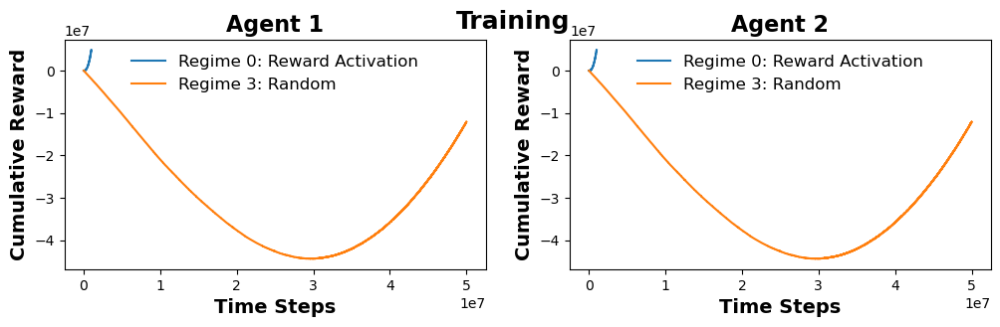

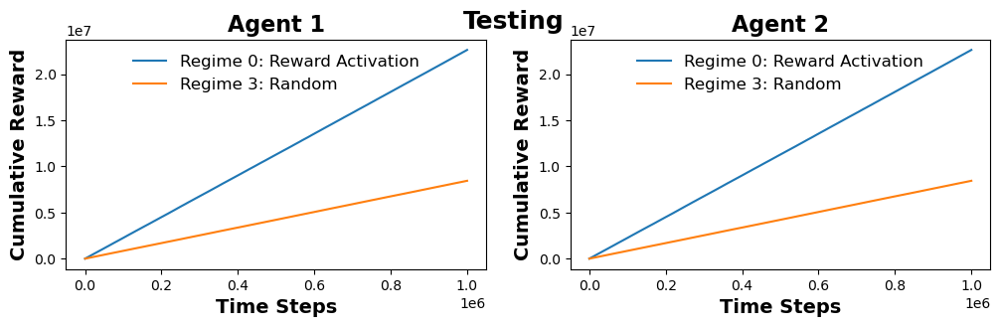

In [5]:
def plot_cumulative_rewards(df, tt=""):
    # regime_names = ['Regime 0: Reward Activation', 'Regime 1: Left Right', 'Regime 2: Up Down', 'Regime 3: Random']
    regime_names = ['Regime 0: Reward Activation', 'Regime 3: Random']
    fig, ax = plt.subplots(1,2,figsize=(12, 3))
    # Loop through each regime and compute cumulative rewards
    for agent, ax in enumerate(ax.flatten()):
        for regime in df["regime_idx"].unique():
            df_regime = df[df["regime_idx"] == regime]
            crh = np.cumsum(df_regime["r1"])
            ax.plot(df_regime["frame_idx"], crh, label=regime_names[regime])

        ax.set_ylabel('Cumulative Reward', fontsize=14, fontweight='bold')
        ax.set_xlabel('Time Steps', fontsize=14, fontweight='bold')
        # ax.set_ylim(min(crh)+min(crh)*0.5, max(crh * 1.5))
        ax.legend(loc="upper center", fontsize=12, frameon=False)
        ax.set_title(f'Agent {agent + 1}', fontsize=16, fontweight='bold')
    plt.suptitle(tt, fontsize=18, fontweight='bold')
    plt.show()
plot_cumulative_rewards(tdf, "Training")
plot_cumulative_rewards(edf, "Testing")

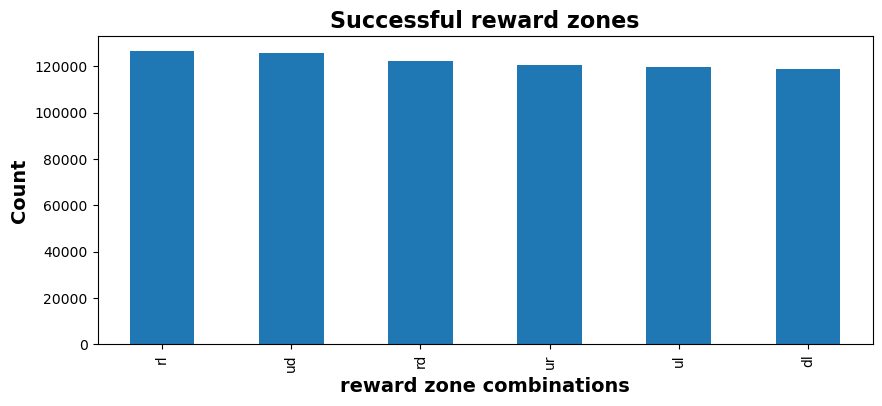

In [6]:
fig, ax = plt.subplots(figsize=(10, 4))
tdf[tdf['collected'] == True].reward_loc.value_counts().plot(kind='bar', ax=ax)
ax.set_xlabel("reward zone combinations", fontsize=14, fontweight='bold')
ax.set_ylabel("Count", fontsize=14, fontweight='bold')
ax.set_title("Successful reward zones", fontsize=16, fontweight='bold')
plt.show()

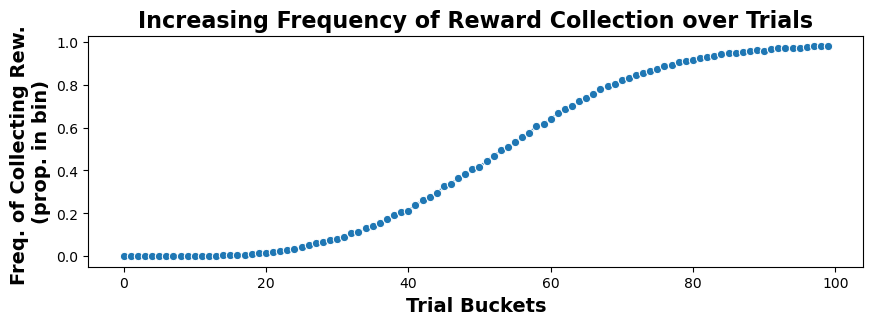

In [15]:
collection = tdf[(tdf.regime_idx == 1) & tdf.terminated].collected
num_bins = 100

collection_bin = pd.cut(collection.index, bins=num_bins)
df = pd.DataFrame({'bin': collection_bin, 'value': collection.values})
freq_df = df.groupby('bin', observed=True)['value'].mean().reset_index()
freq_df['bin_center'] = [interval.mid for interval in freq_df['bin']]

# Plot
plt.figure(figsize=(10, 3))
sns.lineplot(x=freq_df['bin_center'].index, y=freq_df['value'], marker='o')
plt.xlabel('Trial Buckets', fontsize=14, fontweight='bold')
plt.ylabel('Freq. of Collecting Rew. \n(prop. in bin)', fontsize=14, fontweight='bold')
plt.title('Increasing Frequency of Reward Collection over Trials', fontsize=16, fontweight='bold')
plt.show()

### Animation stepping

In [8]:
import sys
sys.path.append('/home/nuttidalab/Documents/rudra/MARLAX')

from marlax.utils import animate_simulation_by_df

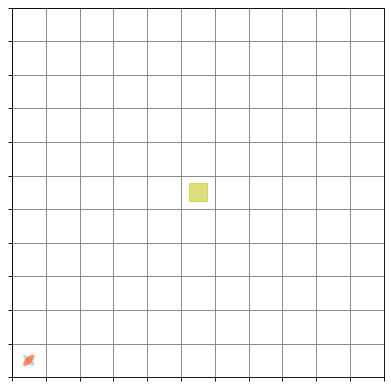

In [9]:
ani = animate_simulation_by_df(tdf, regime=1, start_frame=200_000_000-500, end_frame=200_000_000, grid_size=11, interval=200)
HTML(ani.to_jshtml())

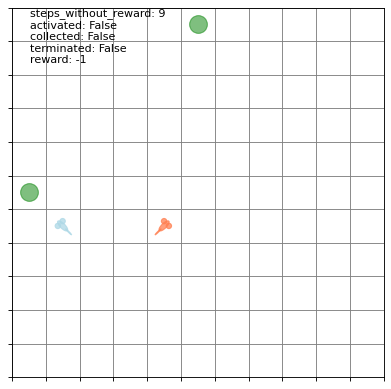

In [10]:
ani = animate_simulation_by_df(edf, regime=1, start_frame=0, end_frame=500, grid_size=11, interval=200)
HTML(ani.to_jshtml())

In [43]:
import ast
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Ellipse, Circle

def animate_simulation_by_df(df, regime, start_frame, end_frame, grid_size=11, interval=100):
    """
    Create an animation for a given regime and frame range that supports multiple agents.
    
    Parameters:
      df         : DataFrame containing columns with agent positions, reward_loc,
                   steps_without_reward, activated, collected, terminated, etc.
                   Expected agent columns follow the format: a1x, a1y, a2x, a2y, ... 
      regime     : The regime index to animate.
      start_frame: Starting frame number (inclusive).
      end_frame  : Ending frame number (inclusive).
      grid_size  : The size of the board (default 11).
      interval   : Interval (in ms) between frames.
    
    Returns:
      ani        : The matplotlib.animation.FuncAnimation object.
    """
    
    def rotate_point(x, y, center_x, center_y, angle):
        """Rotate a point (x, y) around a center (center_x, center_y) by a given angle (in degrees)."""
        angle_rad = np.radians(angle)
        x -= center_x
        y -= center_y
        x_new = x * np.cos(angle_rad) - y * np.sin(angle_rad)
        y_new = x * np.sin(angle_rad) + y * np.cos(angle_rad)
        return x_new + center_x, y_new + center_y

    def get_reward_coord(direction, grid_size):
        """
        Given a direction string ('up', 'down', 'left', 'right'),
        return the corresponding board coordinate.
        - 'up'    => top center: (grid_size//2, grid_size - 1)
        - 'down'  => bottom center: (grid_size//2, 0)
        - 'left'  => left center: (0, grid_size//2)
        - 'right' => right center: (grid_size - 1, grid_size//2)
        """
        if direction == 'u':
            return (grid_size // 2, grid_size - 1)
        elif direction == 'd':
            return (grid_size // 2, 0)
        elif direction == 'l':
            return (0, grid_size // 2)
        elif direction == 'r':
            return (grid_size - 1, grid_size // 2)
        else:
            return None
    
    # Filter by regime and frame range.
    subdf = df[(df['regime_idx'] == regime) & 
               (df['frame_idx'] >= start_frame) & 
               (df['frame_idx'] <= end_frame)].sort_values('frame_idx')
    
    # Determine the number of agents by looking for columns like "a{i}x"
    agent_nums = [int(re.findall(r'\d+', col)[0]) for col in subdf.columns if re.match(r'a\d+x', col)]
    num_agents = max(agent_nums) if agent_nums else 0
    if num_agents == 0:
        raise ValueError("No agent position columns found.")
    
    # Build the list of columns to extract in order.
    cols = []
    for i in range(num_agents):
        cols.append(f"a{i+1}x")
        cols.append(f"a{i+1}y")
    cols.extend(["reward_loc", "steps_without_reward", "activated", "collected", "terminated", "r1"])
    
    # Pre-extract necessary columns into a record array.
    steps = subdf[cols].to_records(index=False)
    
    # Set up the figure and axis.
    fig, ax = plt.subplots(figsize=(6,6), dpi=80)
    ax.set_xlim(-0.5, grid_size-0.5)
    ax.set_ylim(-0.5, grid_size-0.5)
    ax.set_xticks(np.arange(-0.5, grid_size, 1))
    ax.set_yticks(np.arange(-0.5, grid_size, 1))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.grid(True, color='white')
    # Set the face color of the board.
    ax.set_facecolor('xkcd:black')
    # Set background color to black
    fig.patch.set_facecolor('xkcd:black')
    # # set ticks off
    # ax.xaxis.set_major_locator(ticker.NullLocator())
    # ax.yaxis.set_major_locator(ticker.NullLocator())
    # # Hide the spines
    # for spine in ax.spines.values():
    #     spine.set_visible(False)
    
    # Create agent shapes dynamically.
    # Define a list of colors to cycle through.
    colors = ['lightblue', 'pink', 'green', 'orange', 'purple', 'pink', 'cyan']
    # For simplicity, use a default angle: even-indexed agents rotate by 45° and odd-indexed by -45°.
    agent_patches = []
    for i in range(num_agents):
        color = colors[i % len(colors)]
        default_angle = 45 if i % 2 == 0 else -45
        mouse = Ellipse((0, 0), 0.15, 0.4, angle=default_angle, color=color, alpha=.9, label=f"Agent {i+1}")
        ear1  = Circle((0, 0), 0.08, color=color, alpha=.9)
        ear2  = Circle((0, 0), 0.08, color=color, alpha=.9)
        tail  = Ellipse((0, 0), 0.03, 0.25, angle=default_angle, color=color, alpha=.9)
        agent_patches.append({
            'mouse': mouse,
            'ear1': ear1,
            'ear2': ear2,
            'tail': tail,
            'default_angle': default_angle
        })
        ax.add_patch(mouse)
        ax.add_patch(ear1)
        ax.add_patch(ear2)
        ax.add_patch(tail)
    
    # Create reward markers (two possible locations) and the center activation marker.
    reward_marker1, = ax.plot([], [], 'go', alpha=0.5, markersize=16, label="Reward", antialiased=False)
    reward_marker2, = ax.plot([], [], 'go', alpha=0.5, markersize=16, label="Reward", antialiased=False)
    center_marker, = ax.plot([], [], 'ys', alpha=0.5, markersize=16, label="Center", antialiased=False)
    center_marker.set_data([grid_size//2], [grid_size//2])
    
    # Create a text object for metadata.
    meta_text = ax.text(0.05, grid_size-0.5, '', fontsize=10, color='black',
                        transform=ax.transData, verticalalignment='top')
    
    def init():
        # Reset all agent patch positions.
        for patches in agent_patches:
            patches['mouse'].set_center((0, 0))
            patches['ear1'].set_center((0, 0))
            patches['ear2'].set_center((0, 0))
            patches['tail'].set_center((0, 0))
        reward_marker1.set_data([], [])
        reward_marker2.set_data([], [])
        center_marker.set_data([grid_size//2], [grid_size//2])
        meta_text.set_text('')
        # Return all drawn objects for blitting.
        return ([reward_marker1, reward_marker2, center_marker, meta_text] +
                [patch for agent in agent_patches for patch in [agent['mouse'], agent['ear1'], agent['ear2'], agent['tail']]])
    
    def update(frame):
        step = steps[frame]
        # Update each agent's patches.
        for i in range(num_agents):
            x = step[f"a{i+1}x"]
            y = step[f"a{i+1}y"]
            angle = agent_patches[i]['default_angle']
            ear1_x, ear1_y = rotate_point(x + 0.1, y + 0.1, x, y, angle)
            ear2_x, ear2_y = rotate_point(x - 0.1, y + 0.1, x, y, angle)
            tail_x, tail_y = rotate_point(x, y - 0.25, x, y, angle)
            agent_patches[i]['mouse'].set_center((x, y))
            agent_patches[i]['ear1'].set_center((ear1_x, ear1_y))
            agent_patches[i]['ear2'].set_center((ear2_x, ear2_y))
            agent_patches[i]['tail'].set_center((tail_x, tail_y))
        
        # Update reward markers and activation zone.
        reward_loc = step['reward_loc']
        steps_without_reward = step['steps_without_reward']
        activated = step['activated']
        collected = step['collected']
        terminated = step['terminated']
        reward = step['r1']
        
        # print(reward_loc)
        if reward_loc != None:
            # If stored as a string, try parsing it.
            reward_tuple = reward_loc
            if reward_tuple is not None:
                # First reward direction.
                if len(reward_tuple) > 0:
                    coord1 = get_reward_coord(reward_tuple[0], grid_size)
                    if coord1 is not None:
                        reward_marker1.set_data([coord1[0]], [coord1[1]])
                    else:
                        reward_marker1.set_data([], [])
                else:
                    reward_marker1.set_data([], [])
                # Second reward direction.
                if len(reward_tuple) > 1:
                    coord2 = get_reward_coord(reward_tuple[1], grid_size)
                    if coord2 is not None:
                        reward_marker2.set_data([coord2[0]], [coord2[1]])
                    else:
                        reward_marker2.set_data([], [])
                else:
                    reward_marker2.set_data([], [])
            else:
                reward_marker1.set_data([], [])
                reward_marker2.set_data([], [])
            # Hide the center marker when rewards are active.
            center_marker.set_data([], [])
        else:
            reward_marker1.set_data([], [])
            reward_marker2.set_data([], [])
            center_marker.set_data([grid_size//2], [grid_size//2])
        
        # meta_str = (f"steps_without_reward: {steps_without_reward}\n"
        #             f"activated: {activated}\n"
        #             f"collected: {collected}\n"
        #             f"terminated: {terminated}\n"
        #             f"reward: {reward}")
        # meta_text.set_text(meta_str)
        # Change board face color when reward is collected.
        facecolor = 'darkgreen' if collected else 'black'
        ax.set_facecolor(f'xkcd:{facecolor}')
        ax.grid(True, color='white')
        # set the top and right spines to invisible
        # ax.spines['top'].set_visible(False)
        # ax.spines['right'].set_visible(False)
        # ax.spines['left'].set_visible(False)
        # ax.spines['bottom'].set_visible(False)
        
        # Return all objects that have been updated.
        return ([reward_marker1, reward_marker2, center_marker, meta_text] +
                [patch for agent in agent_patches for patch in [agent['mouse'], agent['ear1'], agent['ear2'], agent['tail']]])
    
    ani = animation.FuncAnimation(fig, update, frames=len(steps), init_func=init,
                                  blit=True, interval=interval)
    return ani


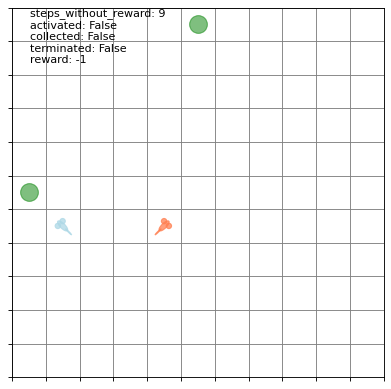

In [11]:
ani = animate_simulation_by_df(edf, regime=1, start_frame=0, end_frame=500, grid_size=11, interval=200)
HTML(ani.to_jshtml())

In [12]:
# # # Save as GIF
gif_filename = "t.gif"
ani.save(gif_filename, writer=PillowWriter(fps=3))

print(f"Animation saved as {gif_filename}")

Animation saved as t.gif
